In [1]:
import os
from pathlib import Path
import pandas as pd
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set working directory to the base directory 'gpudrive'
working_dir = Path.cwd()
while working_dir.name != 'gpudrive':
    working_dir = working_dir.parent
    if working_dir == Path.home():
        raise FileNotFoundError("Base directory 'gpudrive' not found")
os.chdir(working_dir)

### Load csv files with training logs

In [2]:
base_path = "examples/notebooks/dataframes/"

In [3]:
WINDOW_SIZE = 10
X_LIMIT = 250

df_ga_step = pd.read_csv(f"{base_path}goal_achieved_step.csv")
df_ga_time = pd.read_csv(f"{base_path}goal_achieved_time.csv")
df_or_step = pd.read_csv(f"{base_path}collisions_step.csv")

# Get the values
# x-axes
global_steps = df_ga_step["global_step"].rolling(window=WINDOW_SIZE).mean().dropna().values[:X_LIMIT]
wallclock_time = df_ga_time["performance/uptime"].rolling(window=WINDOW_SIZE).mean().dropna().values[:X_LIMIT]

# y-axes
perc_goal_achieved = df_ga_step["PPO__S_100__12_03_16_06_17 - metrics/perc_goal_achieved"].rolling(window=WINDOW_SIZE).mean().dropna().values[:X_LIMIT]
perc_offroad = df_or_step["PPO__S_100__12_03_16_06_17 - metrics/perc_off_road"].rolling(window=WINDOW_SIZE).mean().dropna().values[:X_LIMIT]
perc_collisions = df_or_step["PPO__S_100__12_03_16_06_17 - metrics/perc_veh_collisions"].rolling(window=WINDOW_SIZE).mean().dropna().values[:X_LIMIT]    
wallclock_time = wallclock_time/60

print(global_steps.shape, wallclock_time.shape, perc_goal_achieved.shape)

(250,) (250,) (250,)


In [4]:
perc_goal_achieved[-1]

0.9373640935965692

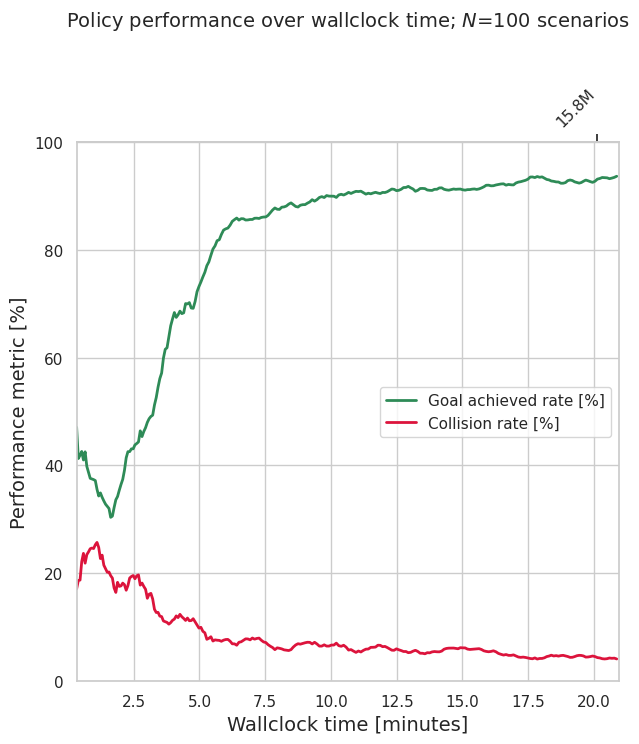

In [5]:
# Compute the combined collision rate
combined_collisions = (perc_collisions) * 100 
perc_goal_achieved *= 100

# Set up Seaborn for styling
sns.set_theme(style="whitegrid")

# Create figure and axis
fig, ax = plt.subplots()
fig.set_size_inches(7, 7)
ax.set_xlim(wallclock_time.min(), wallclock_time.max())
ax.set_ylim(-0.1, 100) 

ax.set_title("Policy performance over wallclock time; $N$=100 scenarios", fontsize=14, y=1.2)
ax.set_xlabel("Wallclock time [minutes]", fontsize=14)
ax.set_ylabel("Performance metric [%]", fontsize=14)

# Create secondary x-axis
ax2 = ax.secondary_xaxis('top')
#ax2.set_xlabel("Global Step", fontsize=12)

# Shorten global steps for display in thousands or millions
def format_global_steps(steps):
    formatted = []
    for step in steps:
        if step >= 1_000_000:
            formatted.append(f"{step / 1_000_000:.1f}M")  # Display in millions
        elif step >= 1_000:
            formatted.append(f"{step / 1_000:.1f}K")  # Display in thousands
        else:
            formatted.append(str(step))  # Display the number as is
    return formatted

formatted_global_steps = format_global_steps(global_steps)

# Initialize the lines for each metric
line_goal, = ax.plot([], [], color="seagreen", lw=2, label="Goal achieved rate [%]")
line_collision, = ax.plot([], [], color="crimson", lw=2, label="Collision rate [%]")

# Add a legend
ax.legend(loc="center right")

# Animation update function
def animate(i):
    # Update each line with the current data up to the ith frame
    line_goal.set_data(wallclock_time[:i], perc_goal_achieved[:i])
    line_collision.set_data(wallclock_time[:i], combined_collisions[:i])
    
    # Update secondary x-axis ticks to correspond with wallclock_time every 10 frames
    if i % 20 == 0:
        ax2.set_xticks([wallclock_time[i]])  # Set tick as a list
        ax2.set_xticklabels([formatted_global_steps[i]], rotation=45, ha="right")  # Set label as a list
    
    return line_goal, line_collision

# Create the animation
ani = animation.FuncAnimation(
    fig, 
    animate, 
    frames=len(wallclock_time),
    interval=50, 
    blit=True, 
    repeat=True
)

# Save the animation as a GIF
ani.save('learning_anim_12_03.gif', writer='pillow', fps=30, dpi=200)

# Display animation 
HTML(ani.to_jshtml())